In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import arviz as az
import pickle
import corner


/opt/anaconda3/envs/pluto/lib/python3.10/site-packages/arviz/__init__.py:39: FutureWarning: 
ArviZ is undergoing a major refactor to improve flexibility and extensibility while maintaining a user-friendly interface.
Some upcoming changes may be backward incompatible.
For details and migration guidance, visit: https://python.arviz.org/en/latest/user_guide/migration_guide.html
  warn(


### load in dataresults for kepler1513

In [2]:
with open("../Outputs/datainfo_kepler1513.pkl", "rb") as f:
    datainfo = pickle.load(f)

curves = datainfo["curves"]
data_info = datainfo["data_info"]
tmids_lineph = [curve["tmidi"] for curve in curves]
info = datainfo["info"]
print(tmids_lineph)

[np.float64(277.50639), np.float64(438.39047800000003), np.float64(760.158654), np.float64(921.042742), np.float64(1081.9268299999999), np.float64(1242.810918), np.float64(1403.695006), np.float64(1564.579094)]


### load in vanilla mcmc

In [3]:
vanilla_posterior = az.from_netcdf("../Outputs/arviz_kepler1513_vanilla.nc")
burnin = info["burnin_van"]
vanilla_posterior = vanilla_posterior.sel(draw=slice(burnin, None))


In [4]:
vanilla_results = datainfo["vanilla_results"]
vanilla_alpha_samps = vanilla_results["alpha_samps_van"]
#vanilla_logprob = vanilla_results["log_prob_van"]




In [5]:
print(vanilla_posterior.sample_stats)

<xarray.Dataset> Size: 73MB
Dimensions:  (chain: 60, draw: 150000)
Coordinates:
  * chain    (chain) int64 480B 0 1 2 3 4 5 6 7 8 ... 51 52 53 54 55 56 57 58 59
  * draw     (draw) int64 1MB 200000 200001 200002 ... 349997 349998 349999
Data variables:
    lp       (chain, draw) float64 72MB ...
Attributes:
    created_at:                 2025-12-29T00:06:33.112380+00:00
    arviz_version:              0.23.0
    inference_library:          emcee
    inference_library_version:  3.1.6


array([[<Axes: title={'center': 'x'}>, <Axes: title={'center': 'x'}>]],
      dtype=object)

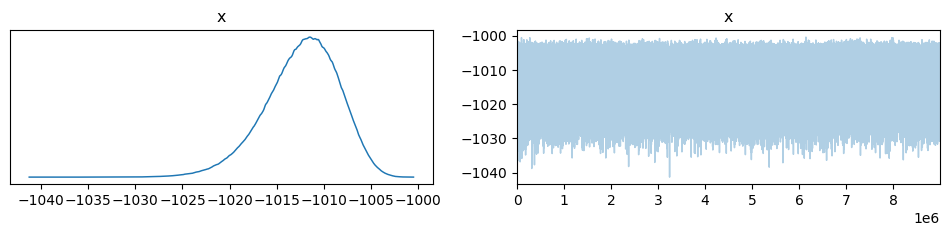

In [6]:
lp_van = vanilla_posterior.sample_stats["lp"]     # shape (chain, draw)

# flatten to shape (chain * draw,)
log_prob_flat_van = lp_van.values.reshape(-1)
az.plot_trace(log_prob_flat_van)


### load in linear mcmc

In [7]:
linear_posterior = az.from_netcdf("../Outputs/arviz_kepler1513_linear.nc")
burnin = info["burnin"]
linear_posterior = linear_posterior.sel(draw=slice(burnin, None))
lp_lin = linear_posterior.sample_stats["lp"]     # shape (chain, draw)


In [8]:
linear_results = datainfo["linear_results"]
linear_alpha_samps = linear_results["linear_alpha_samples"]
linear_logprob = linear_results["linear_logprob"]


In [9]:
print(linear_logprob.shape)

(140000,)


In [10]:
print(linear_posterior.posterior)

<xarray.Dataset> Size: 146MB
Dimensions:   (chain: 28, draw: 50000)
Coordinates:
  * chain     (chain) int64 224B 0 1 2 3 4 5 6 7 8 ... 20 21 22 23 24 25 26 27
  * draw      (draw) int64 400kB 250000 250001 250002 ... 299997 299998 299999
Data variables: (12/13)
    tmid0     (chain, draw) float64 11MB ...
    tmid1     (chain, draw) float64 11MB ...
    tmid2     (chain, draw) float64 11MB ...
    tmid3     (chain, draw) float64 11MB ...
    tmid4     (chain, draw) float64 11MB ...
    tmid5     (chain, draw) float64 11MB ...
    ...        ...
    tmid7     (chain, draw) float64 11MB ...
    p         (chain, draw) float64 11MB ...
    b         (chain, draw) float64 11MB ...
    ln_rho_s  (chain, draw) float64 11MB ...
    q1        (chain, draw) float64 11MB ...
    q2        (chain, draw) float64 11MB ...
Attributes:
    created_at:                 2025-12-29T00:05:55.169868+00:00
    arviz_version:              0.23.0
    inference_library:          emcee
    inference_library_ve

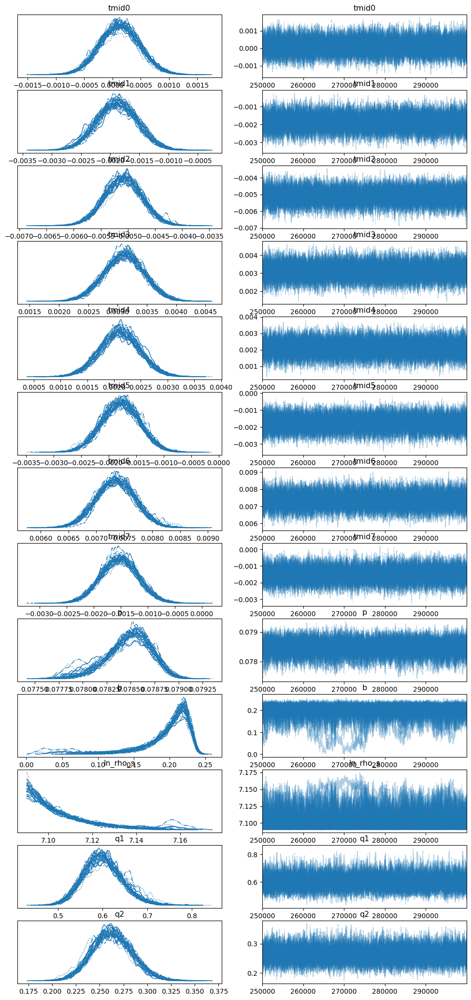

In [11]:
az.summary(linear_posterior)



vars_ = ["tmid0","tmid1","tmid2","tmid3","tmid4","tmid5","tmid6","tmid7", "p", "b", "ln_rho_s", "q1", "q2"]  # adjust names
az.plot_trace(linear_posterior, var_names=vars_, combined=False)
plt.show()



array([[<Axes: title={'center': 'lp'}>, <Axes: title={'center': 'lp'}>]],
      dtype=object)

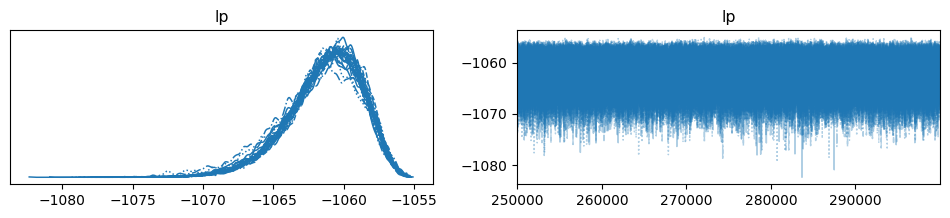

In [12]:
az.plot_trace(linear_posterior.sample_stats, var_names=["lp"])


## load in nonlinear mcmc

In [13]:
nonlinear_posterior = az.from_netcdf("../Outputs/arviz_kepler1513_nonlinear.nc")
burnin = info["burnin"]
nonlinear_posterior = nonlinear_posterior.sel(draw=slice(burnin, None))

In [14]:
nonlinear_results = datainfo["nonlinear_results"]
nonlinear_tmid = nonlinear_results["nonlinear_psi_samps"]
nonlinear_alpha_samps = nonlinear_results["nonlinear_alpha_samples"]
nonlinear_logprob = nonlinear_results["nonlinear_logprob"]

In [15]:
print(nonlinear_posterior.posterior)
print(nonlinear_posterior.sample_stats)

<xarray.Dataset> Size: 24MB
Dimensions:   (chain: 12, draw: 50000)
Coordinates:
  * chain     (chain) int64 96B 0 1 2 3 4 5 6 7 8 9 10 11
  * draw      (draw) int64 400kB 250000 250001 250002 ... 299997 299998 299999
Data variables:
    p         (chain, draw) float64 5MB ...
    b         (chain, draw) float64 5MB ...
    ln_rho_s  (chain, draw) float64 5MB ...
    q1        (chain, draw) float64 5MB ...
    q2        (chain, draw) float64 5MB ...
Attributes:
    created_at:                 2025-12-29T00:05:48.614775+00:00
    arviz_version:              0.23.0
    inference_library:          emcee
    inference_library_version:  3.1.6
<xarray.Dataset> Size: 5MB
Dimensions:  (chain: 12, draw: 50000)
Coordinates:
  * chain    (chain) int64 96B 0 1 2 3 4 5 6 7 8 9 10 11
  * draw     (draw) int64 400kB 250000 250001 250002 ... 299997 299998 299999
Data variables:
    lp       (chain, draw) float64 5MB ...
Attributes:
    created_at:                 2025-12-29T00:05:48.573486+00:00
    ar

array([[<Axes: title={'center': 'lp'}>, <Axes: title={'center': 'lp'}>]],
      dtype=object)

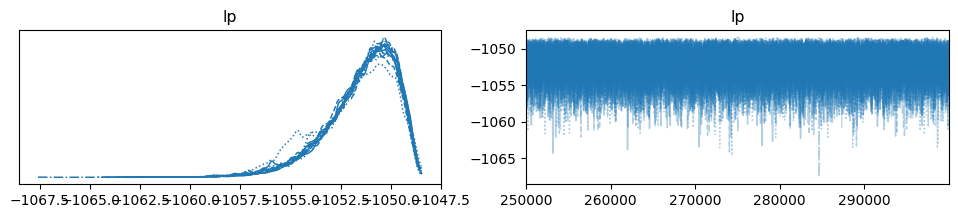

In [16]:
az.plot_trace(nonlinear_posterior.sample_stats, var_names=["lp"])


### load in daniel_posterior

In [17]:
import arviz as az
import numpy as np

daniel_posterior = az.from_netcdf('../Data/kepler1513_transit_posterior.out')
print(daniel_posterior.posterior)


<xarray.Dataset> Size: 2MB
Dimensions:             (chain: 2, draw: 2000, tts_0_dim_0: 10,
                         transit_inds_dim_0: 10, t0_dim_0: 1, period_dim_0: 1,
                         ttvs_0_dim_0: 10)
Coordinates:
  * chain               (chain) int64 16B 0 1
  * draw                (draw) int64 16kB 0 1 2 3 4 ... 1995 1996 1997 1998 1999
  * tts_0_dim_0         (tts_0_dim_0) int64 80B 0 1 2 3 4 5 6 7 8 9
  * transit_inds_dim_0  (transit_inds_dim_0) int64 80B 0 1 2 3 4 5 6 7 8 9
  * t0_dim_0            (t0_dim_0) int64 8B 0
  * period_dim_0        (period_dim_0) int64 8B 0
  * ttvs_0_dim_0        (ttvs_0_dim_0) int64 80B 0 1 2 3 4 5 6 7 8 9
Data variables: (12/20)
    log_rho_star        (chain, draw) float64 32kB ...
    rho_star            (chain, draw) float64 32kB ...
    b                   (chain, draw) float64 32kB ...
    tts_0               (chain, draw, tts_0_dim_0) float64 320kB ...
    transit_inds        (chain, draw, transit_inds_dim_0) int64 320kB ...
    ror

#### table of daniel_posterior values

In [18]:
import arviz as az

az.summary(daniel_posterior,var_names=[
    "ror",
    "rho_star",
    "b",
    "Kepler_q1",
    "Kepler_q2",
    "TESS_q1",
    "TESS_q2",
    "TESS_blend",
    "tts_0",
    "t0",
    "period",
        ])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
ror,0.079,0.000,0.078,0.079,0.000,0.000,1024.0,660.0,1.0
rho_star,1.292,0.038,1.214,1.339,0.001,0.002,1048.0,660.0,1.0
b,0.114,0.074,0.000,0.244,0.003,0.002,804.0,638.0,1.0
Kepler_q1,0.453,0.040,0.379,0.528,0.001,0.001,1882.0,2075.0,1.0
Kepler_q2,0.325,0.029,0.269,0.378,0.001,0.001,2449.0,2006.0,1.0
TESS_q1,0.126,0.123,0.000,0.354,0.002,0.003,4060.0,2202.0,1.0
TESS_q2,0.280,0.245,0.000,0.774,0.004,0.004,4201.0,2509.0,1.0
TESS_blend,1.000,0.000,1.000,1.000,0.000,0.000,2907.0,1478.0,1.0
tts_0[0],277.506,0.000,277.505,277.506,0.000,0.000,3999.0,2702.0,1.0
tts_0[1],438.388,0.000,438.387,438.389,0.000,0.000,3996.0,2784.0,1.0


#### get median and +/- 1$\sigma$ tmid values from each one

In [19]:

###daniel calc
tts_d_median = []
t0_d_median = np.median(daniel_posterior.posterior["t0"].values)

tts_d_err = []
for ii in range(0, 8):
    tts_d = np.median(daniel_posterior.posterior["tts_0"].values[:, :, ii])
    tts_d_median.append(tts_d)
    
    
    tts_d_quantile = [np.quantile(daniel_posterior.posterior["tts_0"].values[:, :, ii], 0.16),
                    np.quantile(daniel_posterior.posterior["tts_0"].values[:, :, ii], 0.84)]
    
    tts_d_err.append(np.array([
        tts_d - tts_d_quantile[0],
        tts_d_quantile[1] - tts_d
    ]))
    
    print(tts_d, tts_d_err[ii])
    

tts_d_err = np.array(tts_d_err).T

###vanilla calc

tts_v_median = []
t0_v_median = 277.506

tts_v_err = []
for ii in range(0, 8):
    tts_v = np.median(vanilla_posterior.posterior[f"tmid{ii}"].values)
    tts_v_median.append(tts_v)
    
    
    tts_v_quantile = [np.quantile(vanilla_posterior.posterior[f"tmid{ii}"].values, 0.16),
                    np.quantile(vanilla_posterior.posterior[f"tmid{ii}"].values, 0.84)]
    
    tts_v_err.append(np.array([
        tts_v - tts_v_quantile[0],
        tts_v_quantile[1] - tts_v
    ]))
    
    print(f"vanilla: relative tmid{ii} {tts_v}, and 1 sigma {tts_v_err[ii]}")
    

tts_v_err = np.array(tts_v_err).T

###linear calc

tts_l_median = []
t0_l_median = 277.506

tts_l_err = []
for ii in range(0, 8):
    tts_l = np.median(linear_posterior.posterior[f"tmid{ii}"].values)
    tts_l_median.append(tts_l)
    
    
    tts_l_quantile = [np.quantile(linear_posterior.posterior[f"tmid{ii}"].values, 0.16),
                    np.quantile(linear_posterior.posterior[f"tmid{ii}"].values, 0.84)]
    
    tts_l_err.append(np.array([
        tts_l - tts_l_quantile[0],
        tts_l_quantile[1] - tts_l
    ]))
    
    print(f"linear: relative tmid{ii} {tts_l}, and 1 sigma {tts_l_err[ii]}")
    

tts_l_err = np.array(tts_l_err).T


###nonlinear calc

tts_nl_median = []
t0_nl_median = 277.506

tts_nl_err = []
for ii in range(0, 8):
    tts_nl = np.median(nonlinear_tmid)
    tts_nl_median.append(tts_nl)
    
    
    tts_nl_quantile = [np.quantile(nonlinear_tmid, 0.16),
                    np.quantile(nonlinear_tmid, 0.84)]
    
    tts_nl_err.append(np.array([
        tts_nl - tts_nl_quantile[0],
        tts_nl_quantile[1] - tts_nl
    ]))
    
    print(f"nonlinear: relative tmid{ii} {tts_nl}, and 1 sigma {tts_nl_err[ii]}")
    

tts_nl_err = np.array(tts_nl_err).T



277.5056279571054 [0.00037534 0.00040132]
438.3877701232243 [0.00045058 0.00042884]
760.1546033967913 [0.00046111 0.00045595]
921.0457522675113 [0.00038826 0.00041212]
1081.9294412527865 [0.00041157 0.00040395]
1242.8089948589727 [0.00034869 0.00035472]
1403.7018577677827 [0.00043503 0.00043351]
1564.5776120989847 [0.00035384 0.00037547]
vanilla: relative tmid0 0.00012675063680107218, and 1 sigma [0.00035106 0.00035644]
vanilla: relative tmid1 -0.001877672596151389, and 1 sigma [0.00035171 0.00035527]
vanilla: relative tmid2 -0.005089370604752372, and 1 sigma [0.00034762 0.00034759]
vanilla: relative tmid3 0.0031152262634947412, and 1 sigma [0.00034706 0.00034275]
vanilla: relative tmid4 0.0021033179687417842, and 1 sigma [0.00037802 0.00037566]
vanilla: relative tmid5 -0.0017798288210858126, and 1 sigma [0.00034222 0.00034631]
vanilla: relative tmid6 0.007348636740490287, and 1 sigma [0.00035531 0.00035367]
vanilla: relative tmid7 -0.001522263279440676, and 1 sigma [0.00035288 0.00035

#### make corner plots

In [20]:
print(vanilla_results["alpha_samps_van"][590000:].shape)
print(linear_results["linear_alpha_samples"][130000:].shape)
print(nonlinear_results["nonlinear_alpha_samples"][50000:].shape)

(310000, 5)
(10000, 5)
(10000, 5)


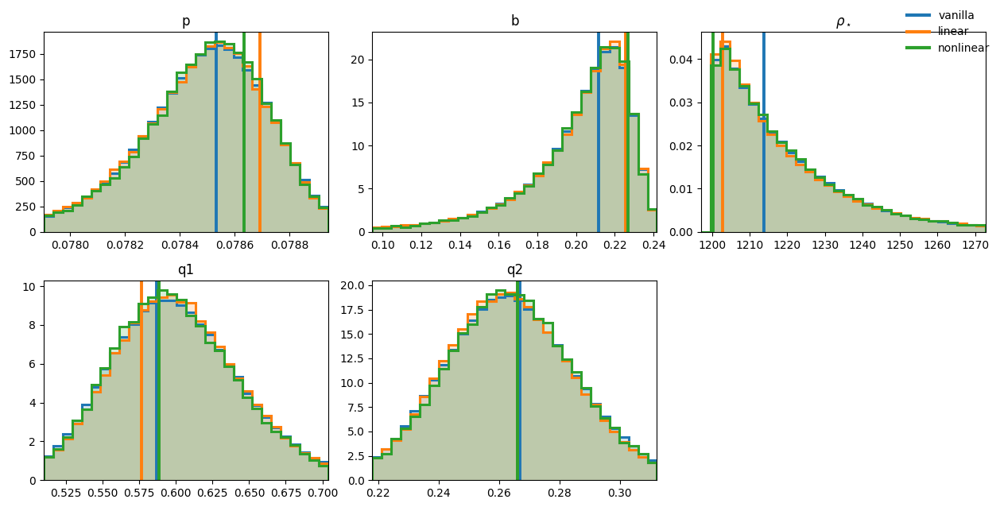

In [21]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import numpy as np

# High-contrast, colorblind-friendly-ish palette
colors = ["#0072B2", "#D55E00", "#009E73"]  # blue, vermillion, green

    
datasets = []
datasets.append(("vanilla", vanilla_results["alpha_samps_van"], 
                         vanilla_results["best_alpha_sample_van"]))

datasets.append(("linear", linear_results["linear_alpha_samples"], 
                     linear_results["linear_best_alpha_samp"]))

datasets.append(("nonlinear", nonlinear_results["nonlinear_alpha_samples"], 
                     nonlinear_results["nonlinear_best_alpha_samp"]))



raw_labels = info["alpha_names"]
labels = [r"$\rho_\star$" if name == "ln_rho_s" else name for name in raw_labels]
colors = ["C0", "C1", "C2"]

ranges = []
for i in range(len(labels)):
    x = np.concatenate([arr[:, i] for _, arr, _ in datasets])
    lo, hi = np.percentile(x, [2.5, 97.5])
    pad = 0.05 * (hi - lo) if hi > lo else 1e-6
    ranges.append((lo - pad, hi + pad)) 


npar = len(labels)
ncols = min(3, npar)
nrows = int(np.ceil(npar / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(4.2 * ncols, 3.2 * nrows), squeeze=False)

bins = 30
for j in range(npar):
    ax = axes[j // ncols, j % ncols]

    for k, (name, samples, truths_vec) in enumerate(datasets):
        # filled histogram (light)
        ax.hist(
            samples[:, j],
            bins=bins,
            range=ranges[j],
            density=True,
            alpha=0.18,                 # lighter fill so overlaps stay readable
            color=colors[k],
            histtype="stepfilled",
        )
        # outline histogram (strong)
        ax.hist(
            samples[:, j],
            bins=bins,
            range=ranges[j],
            density=True,
            color=colors[k],
            histtype="step",
            linewidth=2.2,
            label=name if j == 0 else None
        )
        # truth line (very visible)
        ax.axvline(truths_vec[j], color=colors[k], lw=2.8, alpha=1.0)

    ax.set_title(labels[j], fontsize=12)
    ax.set_xlim(ranges[j])
    ax.tick_params(axis="both", which="major", labelsize=10)

# hide unused axes
for idx in range(npar, nrows * ncols):
    axes[idx // ncols, idx % ncols].axis("off")

handles = [Line2D([0], [0], color=colors[i], lw=3, label=name)
           for i, (name, _, _) in enumerate(datasets)]
fig.legend(handles=handles, loc="upper right", frameon=False, fontsize="medium")

plt.tight_layout()
plt.show()


In [22]:
import numpy as np

ndim = len(info["alpha_names"])

for name, arr, _ in datasets:
    a = np.asarray(arr)
    print(name, "raw shape:", a.shape)


vanilla raw shape: (900000, 5)
linear raw shape: (140000, 5)
nonlinear raw shape: (60000, 5)


In [23]:
print(linear_results["linear_alpha_samples"].shape)
linear_results = datainfo["linear_results"]

(140000, 5)


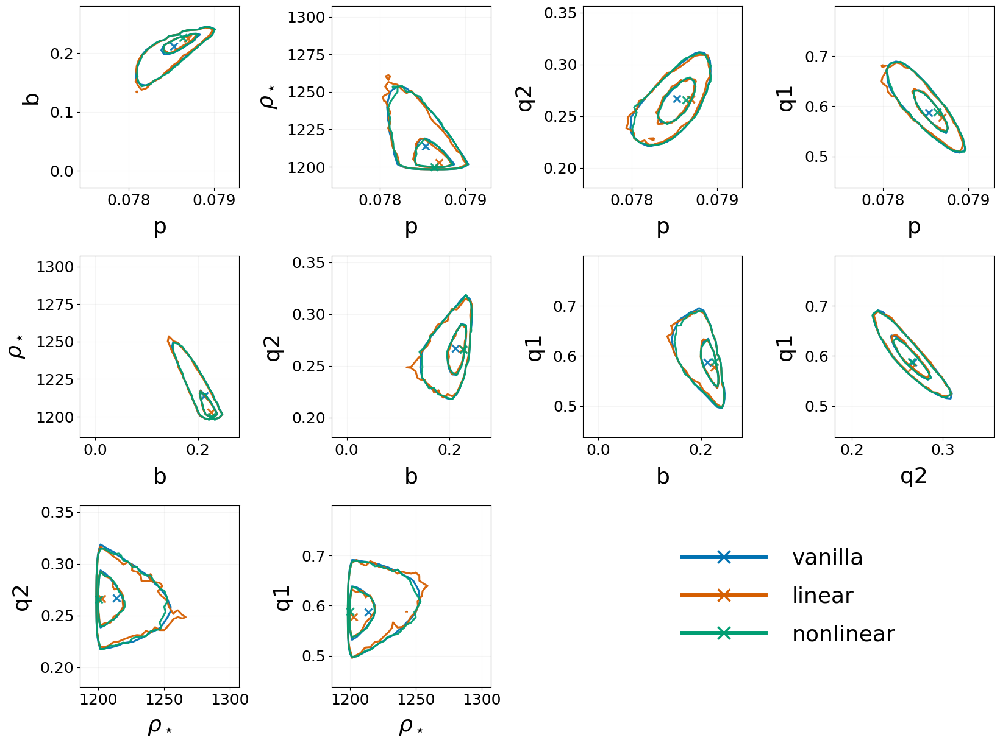

In [46]:
import numpy as np
import matplotlib.pyplot as plt
import corner
from matplotlib.lines import Line2D

# -----------------------------
# Style: big text, minimal clutter
# -----------------------------
plt.rcParams.update({
    "font.size": 20,
    "axes.labelsize": 26,      # << much larger axis labels
    "axes.titlesize": 22,
    "xtick.labelsize": 18,
    "ytick.labelsize": 18,
    "axes.labelpad": 10,       # extra breathing room
    "legend.fontsize": 26,     # base legend size (see below)
    "axes.grid": True,
    "grid.alpha": 0.12,
})

# -----------------------------
# Inputs (your existing objects)
# -----------------------------
datasets = [
    ("vanilla",   vanilla_results["alpha_samps_van"],           vanilla_results["best_alpha_sample_van"]),
    ("linear",    linear_results["linear_alpha_samples"][120000:],       linear_results["linear_best_alpha_samp"]),
    ("nonlinear", nonlinear_results["nonlinear_alpha_samples"], nonlinear_results["nonlinear_best_alpha_samp"]),
]

raw_labels = list(info["alpha_names"])
ndim = len(raw_labels)

# High-contrast palette
colors = ["#0072B2", "#D55E00", "#009E73"]

# -----------------------------
# Helpers
# -----------------------------
def ensure_samples(samples, ndim: int) -> np.ndarray:
    s = np.asarray(samples)
    if s.ndim != 2:
        raise ValueError(f"samples must be 2D, got shape {s.shape}")
    if s.shape[0] == ndim and s.shape[1] != ndim:  # (ndim, nsamples)
        s = s.T
    if s.shape[1] != ndim:
        raise ValueError(f"Cannot match samples shape {s.shape} to ndim={ndim}")
    return s

def pretty(name: str) -> str:
    return r"$\rho_\star$" if name == "ln_rho_s" else name

def robust_ranges(sample_mats, q=(0.001, 0.999), pad_frac=0.15):
    out = []
    d = sample_mats[0].shape[1]
    for j in range(d):
        x = np.concatenate([S[:, j] for S in sample_mats])
        lo, hi = np.quantile(x, q)
        span = hi - lo
        if not np.isfinite(span) or span <= 0:
            span = np.std(x) if np.std(x) > 0 else 1.0
            lo, hi = np.min(x), np.max(x)
        pad = pad_frac * span
        out.append((lo - pad, hi + pad))
    return out

def build_order(raw_labels):
    # Enforces your desired row x-axis order:
    # p (4 panels), b (3), rho_s (2), q2 (1)  -> implies q2 before q1
    desired = ["p", "b", "ln_rho_s", "q2", "q1"]
    if all(name in raw_labels for name in desired):
        return [raw_labels.index(name) for name in desired]

    # fallback: keep original order, but swap q1/q2 if both exist
    order = list(range(len(raw_labels)))
    if "q1" in raw_labels and "q2" in raw_labels:
        i1, i2 = raw_labels.index("q1"), raw_labels.index("q2")
        order[i1], order[i2] = order[i2], order[i1]
    return order

# -----------------------------
# Reorder parameters to match your requested row pattern
# -----------------------------
order = build_order(raw_labels)
labels = [pretty(raw_labels[i]) for i in order]

fixed = []
for name, samps, best in datasets:
    S = ensure_samples(samps, ndim)[:, order]
    best = np.asarray(best).reshape(-1)[order]
    if best.size != ndim:
        raise ValueError(f"{name}: best sample has size {best.size}, expected {ndim}")
    fixed.append((name, S, best))

ranges = robust_ranges([S for _, S, _ in fixed], q=(0.001, 0.999), pad_frac=0.15)
from matplotlib.gridspec import GridSpec

# -----------------------------
# 3-row layout matching your screenshot
# -----------------------------
levels = (0.393, 0.865)  # ~1σ, 2σ
bins = 35

# indices after reordering:
# 0:p, 1:b, 2:rho*, 3:q2, 4:q1
pairs = {
    (0, 0): (0, 1),  # p-b
    (0, 1): (0, 2),  # p-rho*
    (0, 2): (0, 3),  # p-q2
    (0, 3): (0, 4),  # p-q1

    (1, 0): (1, 2),  # b-rho*
    (1, 1): (1, 3),  # b-q2
    (1, 2): (1, 4),  # b-q1
    (1, 3): (3, 4),  # q2-q1  (far right, one row up)

    (2, 0): (2, 3),  # rho*-q2
    (2, 1): (2, 4),  # rho*-q1
    # (2, 2) and (2, 3) reserved for legend spanning two columns
}

fig = plt.figure(figsize=(4.2 * 4, 4.2 * 3))
gs = GridSpec(3, 4, figure=fig)

# Create axes for panels
axes = {}
for (r, c), (x, y) in pairs.items():
    ax = fig.add_subplot(gs[r, c])
    axes[(r, c)] = ax

    for k, (name, S, best) in enumerate(fixed):
        corner.hist2d(
            S[:, x], S[:, y],
            ax=ax,
            bins=bins,
            range=[ranges[x], ranges[y]],
            plot_datapoints=False,
            plot_density=False,
            fill_contours=False,
            plot_contours=True,
            levels=levels,
            color=colors[k],
            contour_kwargs={"linewidths": 2.2, "alpha": 0.95},
        )
        ax.plot(best[x], best[y], marker="x", ms=9, mew=2.2, color=colors[k], alpha=0.9)

    ax.set_xlim(ranges[x])
    ax.set_ylim(ranges[y])
    ax.set_xlabel(labels[x])
    ax.set_ylabel(labels[y])

# Legend spanning bottom-right (row 3, cols 3-4)
legend_ax = fig.add_subplot(gs[2, 2:4])
legend_ax.axis("off")

handles = [
    Line2D(
        [0], [0],
        color=colors[k],
        lw=5.0,
        marker="x",
        markersize=14,
        markeredgewidth=2.5,
        label=name
    )
    for k, (name, _, _) in enumerate(fixed)
]

legend_ax.legend(
    handles=handles,
    loc="center",          # big centered legend like your screenshot
    frameon=False,
    handlelength=3.8,
    handletextpad=1.2,
    labelspacing=0.8,
    borderpad=0.8,
)

plt.tight_layout()
plt.savefig("../Figures/kepler1513_contours.pdf", bbox_inches="tight", pad_inches=0.02)
plt.show()


In [25]:
# import corner
# import matplotlib 
# matplotlib.rc('text', usetex=False)


# names = ["r",
#     "b",
#     "rho_star",
#     "q1",
#     "q2"
#     ]
# print(nonlinear_alpha_samps.shape, linear_alpha_samps.shape, vanilla_alpha_samps.shape)
# fig = corner.corner(
#     nonlinear_alpha_samps,
#     fig = fig,
#     color = 'C0',
#    # hist_kwargs={"alpha": 0.6, "density" : True},
#     labels=names,
#     bins=40,
#     label_kwargs={'fontsize':23}, labelpad=0.2
# )
# corner.corner(
#     linear_alpha_samps,
#     labels=names,
#     fig = fig,
#     color = 'C1',
#     bins=40,
#     #hist_kwargs={"alpha": 0.6, "density" : True},
#     label_kwargs={'fontsize':23}, labelpad=0.2)

# corner.corner(
#     vanilla_alpha_samps,
#     labels=names,
#     fig = fig,
#     bins=40,
#     color = 'C2',
#     #hist_kwargs={"alpha": 0.6, "density" : True},
#     label_kwargs={'fontsize':23}, labelpad=0.2)




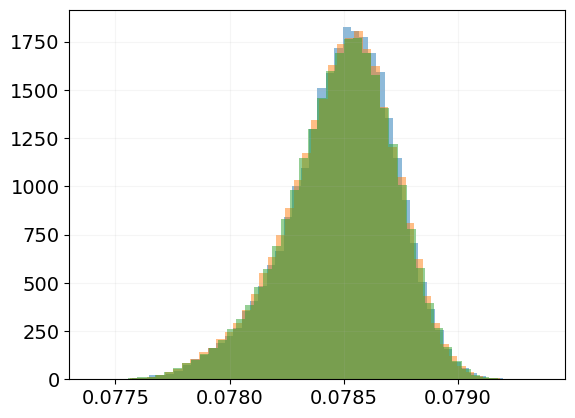

In [26]:

plt.hist(nonlinear_alpha_samps[:,0], bins=50, density=True, alpha=0.5)
plt.hist(linear_alpha_samps[:,0], bins=50, density=True, alpha=0.5)
plt.hist(vanilla_alpha_samps[:,0], bins=50, density=True, alpha=0.5)
plt.show()


In [27]:
print(
    np.median(nonlinear_alpha_samps[:,2]),
    np.median(linear_alpha_samps[:,2]),
    np.median(vanilla_alpha_samps[:,2]),
)

1214.0230555182493 1213.445088000292 1213.992804221219


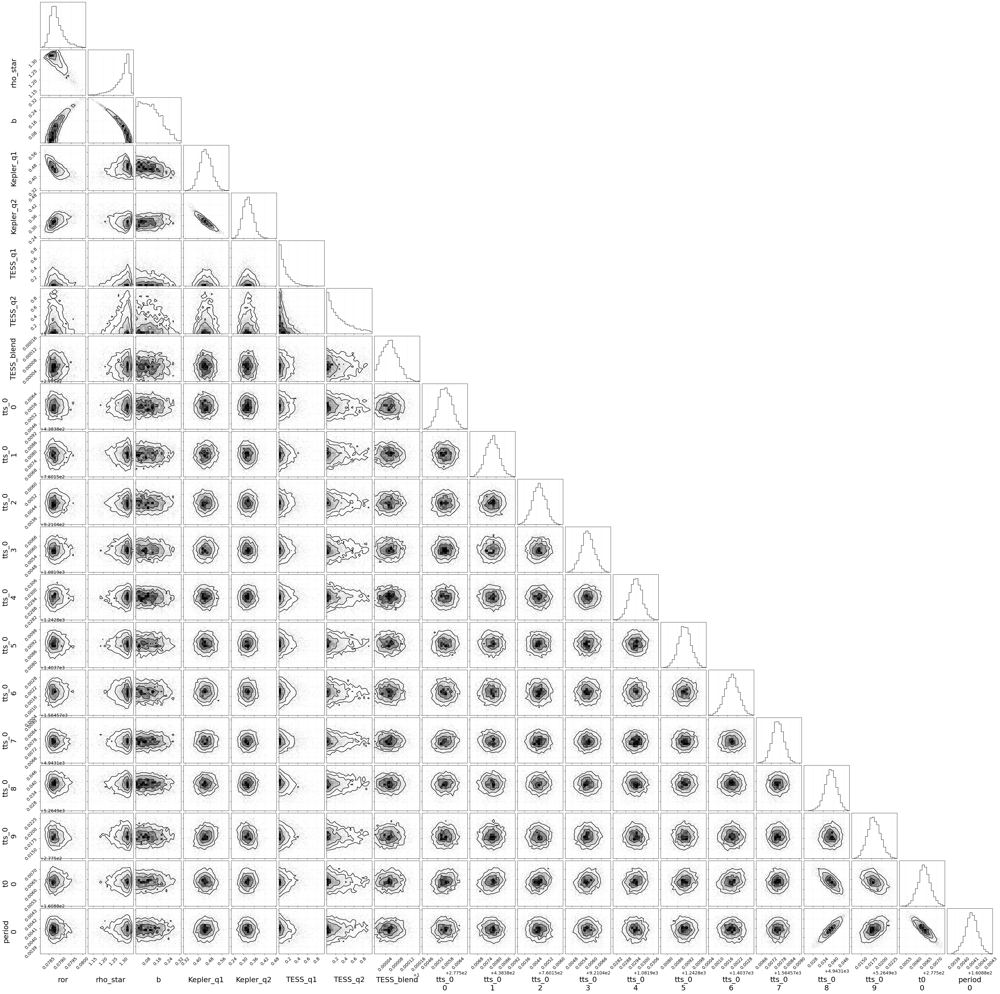

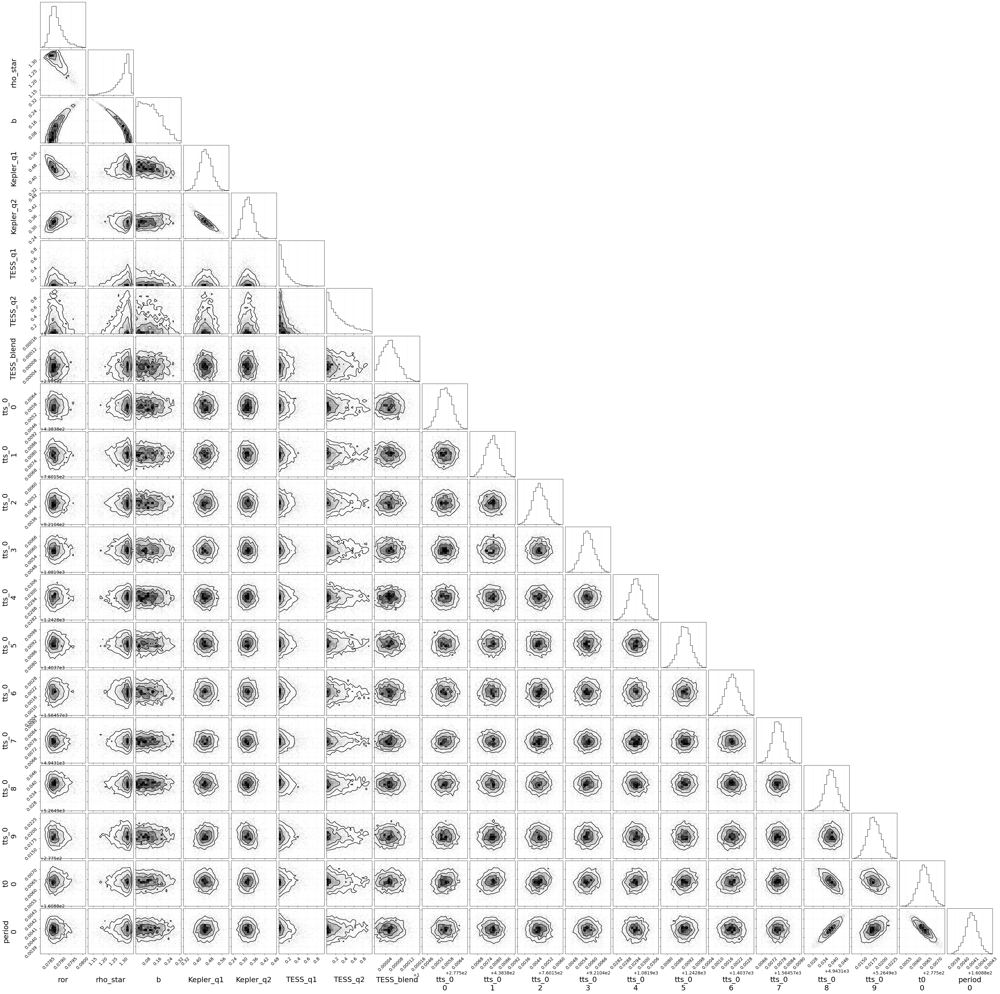

In [28]:
import corner
import matplotlib 
matplotlib.rc('text', usetex=False)


names = ["ror",
    "rho_star",
    "b",
    "Kepler_q1",
    "Kepler_q2",
    "TESS_q1",
    "TESS_q2",
    "TESS_blend",
    "tts_0",
    "t0",
    "period"]

corner.corner(
    daniel_posterior,
    var_names=names,
    label_kwargs={'fontsize':23}, labelpad=0.2
)




In [29]:
###organize tmids

In [30]:
dan_vals = daniel_posterior.posterior["tts_0"].values
nchain, ndraw, ncurves_dan = dan_vals.shape
dan_samples = dan_vals.reshape(-1, ncurves_dan)
tmid_dan_samples = dan_samples[:, :-2]   # drop last 2 columns

ncurves = info["ncurves"]

print(f"ncurves is {ncurves}")

tmid_van_samples = np.vstack([tmids_lineph[i]+
    vanilla_posterior.posterior[f"tmid{i}"].values.reshape(-1)
    for i in range(ncurves)
]).T


tmid_lin_samples = np.vstack([tmids_lineph[i]+
    linear_posterior.posterior[f"tmid{i}"].values.reshape(-1)
    for i in range(ncurves)
]).T

tmid_nonlin_samples = np.asarray([tmids_lineph[i] + nonlinear_tmid for i in range(ncurves)])


print(tmid_dan_samples.shape)
print(tmid_van_samples.shape)
print(tmid_lin_samples.shape)

ncurves is 8
(4000, 8)
(9000000, 8)
(1400000, 8)


#### make corner plots, tmids only

In [31]:
# labels = [f"tmid_{i}" for i in range(ncurves)]

# fig = corner.corner(
#     tmid_dan_samples,
#     labels=labels,
#     color="C0",
#     plot_contours=True,
#     hist_kwargs={"density": True},
# )

# corner.corner(
#     tmid_van_samples,
#     labels=labels,
#     color="C1",
#     fig=fig,
#     plot_contours=True,
#     hist_kwargs={"density": True},
# )

# corner.corner(
#     tmid_lin_samples,
#     labels=labels,
#     color="C2",
#     fig=fig,
#     plot_contours=True,
#     hist_kwargs={"density": True},
# )

# corner.corner(
#     tmid_nonlin_samples,
#     labels=labels,
#     color="C3",
#     fig=fig,
#     plot_contours=True,
#     hist_kwargs={"density": True},
# )

# axes = np.array(fig.axes).reshape((ncurves, ncurves))
# ax_diag = axes[0, 0]

# legend_lines = [
#     plt.Line2D([], [], color="C0", linewidth=2, label="Daniel"),
#     plt.Line2D([], [], color="C1", linewidth=2, label="Vanilla"),
#     plt.Line2D([], [], color="C2", linewidth=2, label="Linear"),
#     plt.Line2D([], [], color="C3", linewidth=2, label="NonLinear"),
# ]

# ax_diag.legend(handles=legend_lines, fontsize=12, loc="upper right")

# plt.tight_layout()
# plt.show()

In [32]:
###plot tmid histograms only

In [33]:
print(nonlinear_tmid)

[[ 1.49104542e-04 -1.87046938e-03 -5.10340548e-03 ... -1.79189473e-03
   7.34821907e-03 -1.48682456e-03]
 [ 1.37706453e-04 -1.89134796e-03 -5.09016826e-03 ... -1.75477911e-03
   7.34845403e-03 -1.49191078e-03]
 [ 1.11997902e-04 -1.86294984e-03 -5.10473140e-03 ... -1.78215852e-03
   7.34132303e-03 -1.50369313e-03]
 ...
 [ 9.90351774e-05 -1.83436407e-03 -5.08250848e-03 ... -1.83546862e-03
   7.30943279e-03 -1.54999459e-03]
 [ 1.50337828e-04 -1.90018533e-03 -5.07657947e-03 ... -1.78939064e-03
   7.37629669e-03 -1.51734166e-03]
 [ 1.30839195e-04 -1.87878323e-03 -5.08943539e-03 ... -1.76927167e-03
   7.37450898e-03 -1.51668809e-03]]


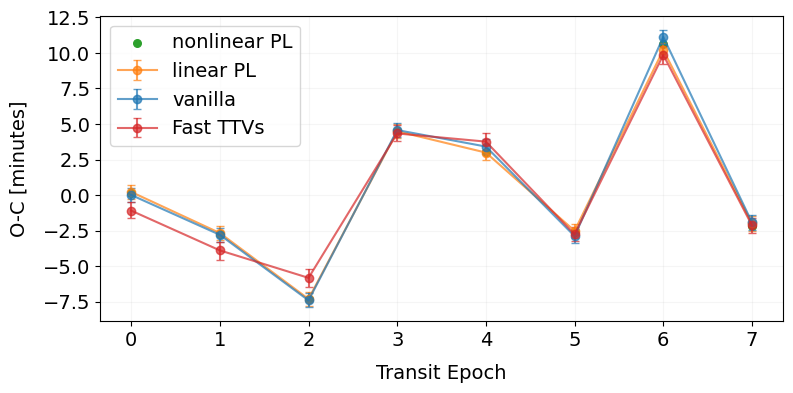

In [57]:
###plot time from linear ephemeris
linear_results = datainfo["linear_results"]
vanilla_results = datainfo["vanilla_results"]
best_tmids_nonlinear = nonlinear_results["nonlinear_best_psi_samp"]
best_tmids_linear = linear_results["linear_bestpsi"]
best_tmids_vanilla = vanilla_results["best_psi_sample_van"]
best_tmids_daniel_rel = np.asarray(tts_d_median) - np.asarray(tmids_lineph) 


x = np.arange(len(best_tmids_nonlinear))
nstd = 1

plt.figure(figsize=(8, 4))

plt.scatter(
    x, best_tmids_nonlinear*1440, label="nonlinear PL", color='C2', s= 30, alpha = 1
)
plt.errorbar(
    x, best_tmids_linear * 1440, yerr=1440*nstd*tts_l_err,
    fmt='-o', capsize=3, alpha=0.7, label="linear PL", color='C1'
)
plt.errorbar(
    x, best_tmids_vanilla*1440, yerr=1440*nstd*tts_v_err,
    fmt='-o', capsize=3, alpha=0.7, label="vanilla", color='C0'
)
plt.errorbar(
    x, best_tmids_daniel_rel*1440, yerr=1440*nstd*tts_d_err,
    fmt='-o', capsize=3, alpha=0.7, label="Fast TTVs", color='C3'
)

plt.xlabel("Transit Epoch", fontsize=14)
plt.ylabel("O-C [minutes]", fontsize=14)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.legend(fontsize=14)
plt.tight_layout()
plt.savefig("../Figures/kepler1513_oc.pdf", bbox_inches="tight", pad_inches=0.02)
plt.show()

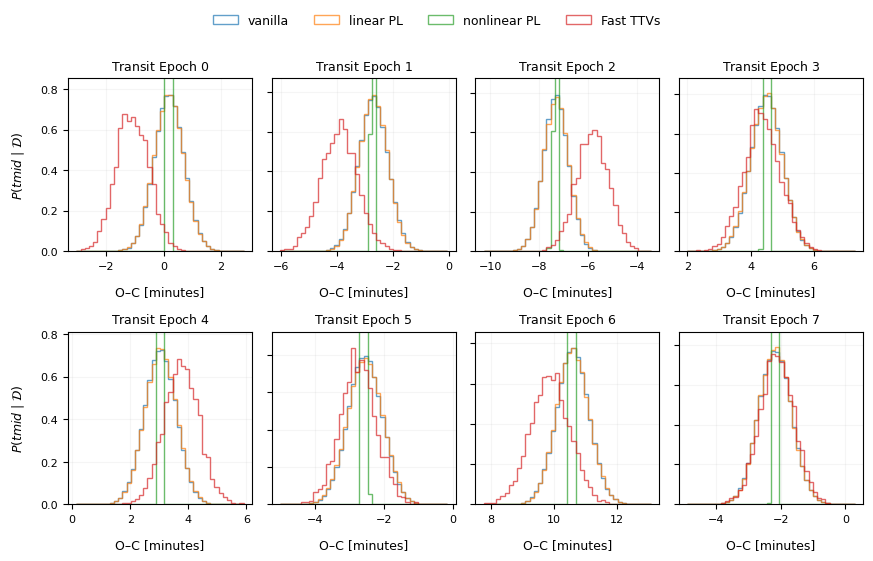

In [54]:
import numpy as np
import matplotlib.pyplot as plt
import math

scale = 1440  # days -> minutes

# ---- font control ----
plt.rcParams.update({
    "font.size": 9,
    "axes.labelsize": 9,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8,
    "legend.fontsize": 9,
})

nrows = 2
ncols = math.ceil(ncurves / nrows)

ylabels = [rf"$P(tmid \mid \mathcal{{D}})$" for i in range(ncurves)]

fig, axes = plt.subplots(
    nrows=nrows,
    ncols=ncols,
    figsize=(2.2 * ncols, 2.6 * nrows),
    sharey=False,
)

axes = np.atleast_1d(axes).flatten()

for i, ax in enumerate(axes):

    if i >= ncurves:
        ax.axis("off")
        continue

    van    = tmid_van_samples[:, i] * scale - (tmids_lineph[i] * scale)
    lin    = tmid_lin_samples[:, i] * scale - (tmids_lineph[i] * scale)
    nonlin = (nonlinear_tmid[:, i] + tmids_lineph[i]) * scale - (tmids_lineph[i] * scale)
    dan    = tmid_dan_samples[:, i] * scale - (tmids_lineph[i] * scale)

    bins = np.histogram_bin_edges(
        np.concatenate([van, lin, nonlin, dan]), bins=40
    )

    ax.hist(van,    bins=bins, histtype="step", alpha=0.7, color="C0", density=True, label="vanilla")
    ax.hist(lin,    bins=bins, histtype="step", alpha=0.7, color="C1", density=True, label="linear PL")
    ax.hist(nonlin, bins=bins, histtype="step", alpha=0.7, color="C2", density=True, label="nonlinear PL")
    ax.hist(dan,    bins=bins, histtype="step", alpha=0.7, color="C3", density=True, label="Fast TTVs")

    y_cap = 1.10 * max(
        np.histogram(van, bins=40, density=True)[0].max(),
        np.histogram(lin, bins=40, density=True)[0].max(),
        np.histogram(dan, bins=40, density=True)[0].max(),
    )
    ax.set_ylim(0, y_cap)

    ax.set_title(rf"$\text{{Transit Epoch }} {i}$", fontsize=9)
    ax.set_xlabel("O–C [minutes]")

    # Only left-most panels get y-labels
    if i % ncols == 0:
        ax.set_ylabel(ylabels[i])
    else:
        ax.set_yticklabels([])

# ---- shared legend on top ----
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(
    handles,
    labels,
    loc="upper center",
    ncol=4,
    frameon=False,
    bbox_to_anchor=(0.5, 1.08),
)

plt.tight_layout()
plt.savefig("../Figures/kepler1513_tmids.pdf", bbox_inches="tight", pad_inches=0.02)

plt.show()


#### helper functions for rounding and latex format

In [ ]:
def round_to_two_sig_figs(median, plus_sigma, minus_sigma):
    # Determine the number of significant figures based on the minimum differences
    num_significant_figures_lower = -int(np.floor(np.log10(minus_sigma))) + 1 if minus_sigma != 0 else 0
    num_significant_figures_upper = -int(np.floor(np.log10(plus_sigma))) + 1 if plus_sigma != 0 else 0
    
    
    # Choose the smaller number of significant figures
    num_significant_figures = min(num_significant_figures_lower, num_significant_figures_upper)
    
    # Round the values to two significant figures
    median_rounded = round(median, num_significant_figures)
    minus_sigma_rounded = round(minus_sigma, num_significant_figures)
    plus_sigma_rounded = round(plus_sigma, num_significant_figures)
    
    return median_rounded, plus_sigma_rounded, minus_sigma_rounded


def latex_expression(rounded_vals):
    rounded_median, rounded_plus_sigma, rounded_minus_sigma = rounded_vals
    latex_str = f"${rounded_median}^{{+{rounded_plus_sigma}}}_{{-{rounded_minus_sigma}}}$"
    return latex_str


#### round to 2 sig figs and turn to latex format

In [ ]:
params = ["tts_0"]

rstar = 0.95 #rsun
for param in params:
    print(param)
    
    #ror is in terms of r_sun, r_* = 0.950 +/- 0.066 r_sun so multiply by this value
    if param == 'ror':
        quantile = [np.quantile(trace.posterior[param].values, 0.16),
                    np.quantile(trace.posterior[param].values, 0.84)]
        
        
        median = np.quantile(trace.posterior[param].values, 0.5)
        
        minus_sigma = median - quantile[0]
        plus_sigma = quantile[1] - median
        
        print(str(median*rstar) + ' + ' + str(plus_sigma*rstar) + ' - ' + str(minus_sigma*rstar))
        print(round_to_two_sig_figs(median*rstar, plus_sigma*rstar, minus_sigma*rstar))
        print(latex_expression(round_to_two_sig_figs(median*rstar, plus_sigma*rstar, minus_sigma*rstar)))
    
    
    if param not in ['tts_0', 'ror']:
        quantile = [np.quantile(trace.posterior[param].values, 0.16),
                    np.quantile(trace.posterior[param].values, 0.84)]

        median = np.quantile(trace.posterior[param].values, 0.5)

        minus_sigma = median - quantile[0]
        plus_sigma = quantile[1] - median

        print(str(median) + ' + ' + str(plus_sigma) + ' - ' + str(minus_sigma))
        print(round_to_two_sig_figs(median, plus_sigma, minus_sigma))
        print(latex_expression(round_to_two_sig_figs(median, plus_sigma, minus_sigma)))

    if param == 'tts_0':
        for ii in range(0, 8):
            print(ii)
            
            
            quantile = [np.quantile(daniel_posterior.posterior[param].values.T[ii], 0.16),
                    np.quantile(daniel_posterior.posterior[param].values.T[ii], 0.84)]
        
        
            median = np.quantile(daniel_posterior.posterior[param].values.T[ii], 0.5)

            minus_sigma = median - quantile[0]
            plus_sigma = quantile[1] - median

            print(str(median) + ' + ' + str(plus_sigma) + ' - ' + str(minus_sigma))
            print(round_to_two_sig_figs(median, plus_sigma, minus_sigma))
            print(latex_expression(round_to_two_sig_figs(median, plus_sigma, minus_sigma)))

            print('')
    print('')        
            
            
    